In [1]:
library(Signac)
library(Seurat)
library(SeuratWrappers)
library(monocle3)
library(Matrix)
library(ggplot2)
library(patchwork)

Signac built for for SeuratObject v4 was just loaded with SeuratObject
v5; disabling v5 assays and validation routines, and ensuring assays
work in strict v3/v4 compatibility mode

필요한 패키지를 로딩중입니다: SeuratObject

필요한 패키지를 로딩중입니다: sp

‘SeuratObject’ was built with package ‘Matrix’ 1.6.3 but the
current version is 1.6.5; it is recomended that you reinstall
‘SeuratObject’ as the ABI for ‘Matrix’ may have changed


다음의 패키지를 부착합니다: ‘SeuratObject’


The following object is masked from ‘package:base’:

    intersect


필요한 패키지를 로딩중입니다: Biobase

필요한 패키지를 로딩중입니다: BiocGenerics


다음의 패키지를 부착합니다: ‘BiocGenerics’


The following object is masked from ‘package:SeuratObject’:

    intersect


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, intersect, is.u

In [2]:
library(EnsDb.Mmusculus.v79)

필요한 패키지를 로딩중입니다: ensembldb

필요한 패키지를 로딩중입니다: GenomicFeatures

필요한 패키지를 로딩중입니다: AnnotationDbi

필요한 패키지를 로딩중입니다: AnnotationFilter


다음의 패키지를 부착합니다: 'ensembldb'


The following object is masked from 'package:stats':

    filter




In [3]:
skin <- readRDS("./RDS/240522.E13_PD4_integrated.2-10.reference.motif.chromvar.newcluster.rds")

In [4]:
skin

An object of class Seurat 
361458 features across 45406 samples within 3 assays 
Active assay: peaks (338904 features, 338904 variable features)
 2 layers present: counts, data
 2 other assays present: RNA, chromvar
 3 dimensional reductions calculated: lsi, umap, peakvi

In [5]:
DefaultAssay(skin) <- "peaks"

In [6]:
Idents(object = skin) <- "label"

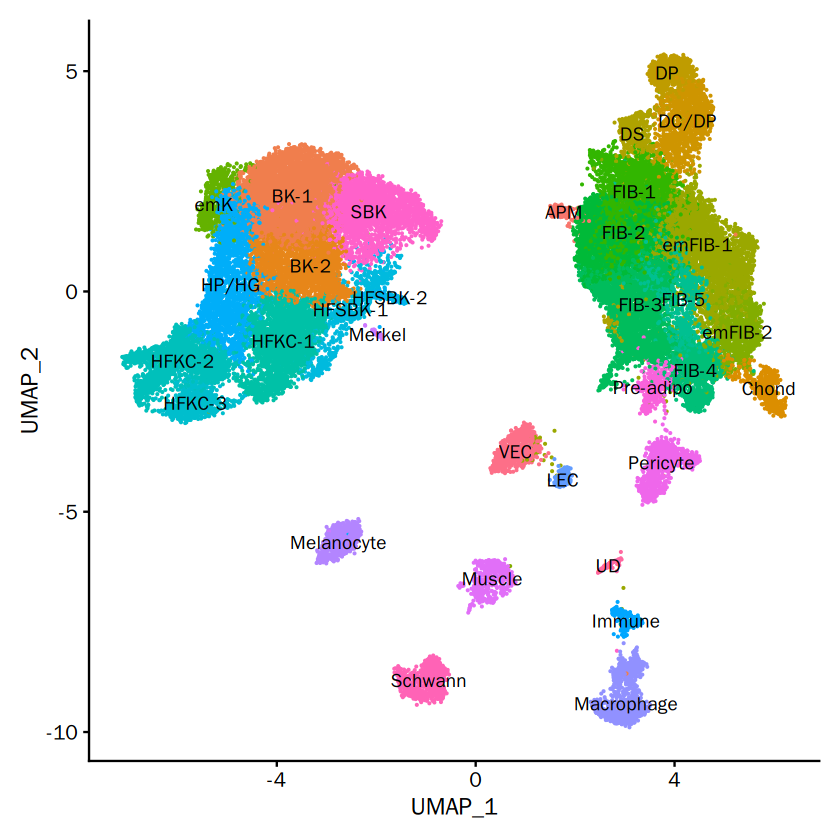

In [7]:
DimPlot(skin, reduction = "umap", label = TRUE, pt.size = 0.1) + NoLegend()

In [62]:
upper.cds <- as.cell_data_set(skin)

Warning message in .check_reddim_names(x, value, withDimnames):
"non-NULL 'rownames(value)' should be the same as 'colnames(x)' for
'reducedDim<-'. This will be an error in the next release of
Bioconductor."
Warning message in .check_reddim_names(x, value, withDimnames):
"non-NULL 'rownames(value)' should be the same as 'colnames(x)' for
'reducedDim<-'. This will be an error in the next release of
Bioconductor."
Warning message in .check_reddim_names(x, value[[v]], withDimnames = TRUE, vname = sprintf("value[[%s]]", :
"non-NULL 'rownames(value[[1]])' should be the same as 'colnames(x)' for
'reducedDims<-'. This will be an error in the next release of
Bioconductor."
Warning message in .check_reddim_names(x, value[[v]], withDimnames = TRUE, vname = sprintf("value[[%s]]", :
"non-NULL 'rownames(value[[3]])' should be the same as 'colnames(x)' for
'reducedDims<-'. This will be an error in the next release of
Bioconductor."
Warning message:
"Monocle 3 trajectories require cluster partitions,

In [63]:
upper.cds

class: cell_data_set 
dim: 338904 45406 
metadata(0):
assays(2): counts logcounts
rownames(338904): chr1-3094225-3095684 chr1-3104906-3105252 ...
  chrY-2261877-2262107 chrY-2340329-2340691
rowData names(0):
colnames(45406): E13.5_ATAC_AAACGAAAGCCTCGCA-1
  E13.5_ATAC_AAACGAAGTAGACGCA-1 ... PD4_ATAC_geni2_TTTGTGTTCAGTCAAC-1
  PD4_ATAC_geni2_TTTGTGTTCTCTTAAC-1
colData names(71): orig.ident nCount_peaks ... ident Size_Factor
reducedDimNames(3): LSI UMAP PEAKVI
mainExpName: peaks
altExpNames(0):

In [64]:
upper.cds <- cluster_cells(cds = upper.cds, k=10, cluster_method = "louvain", reduction_method = "UMAP") 

In [65]:
upper.cds <- learn_graph(upper.cds, use_partition = TRUE)

  |======================================================================| 100%
  |======================================================================| 100%
  |======================================================================| 100%
  |======================================================================| 100%
  |======================================================================| 100%
  |======================================================================| 100%
  |======================================================================| 100%


In [66]:
options(repr.plot.width = 15, repr.plot.height = 15)

Warning message:
"ggrepel: 129 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


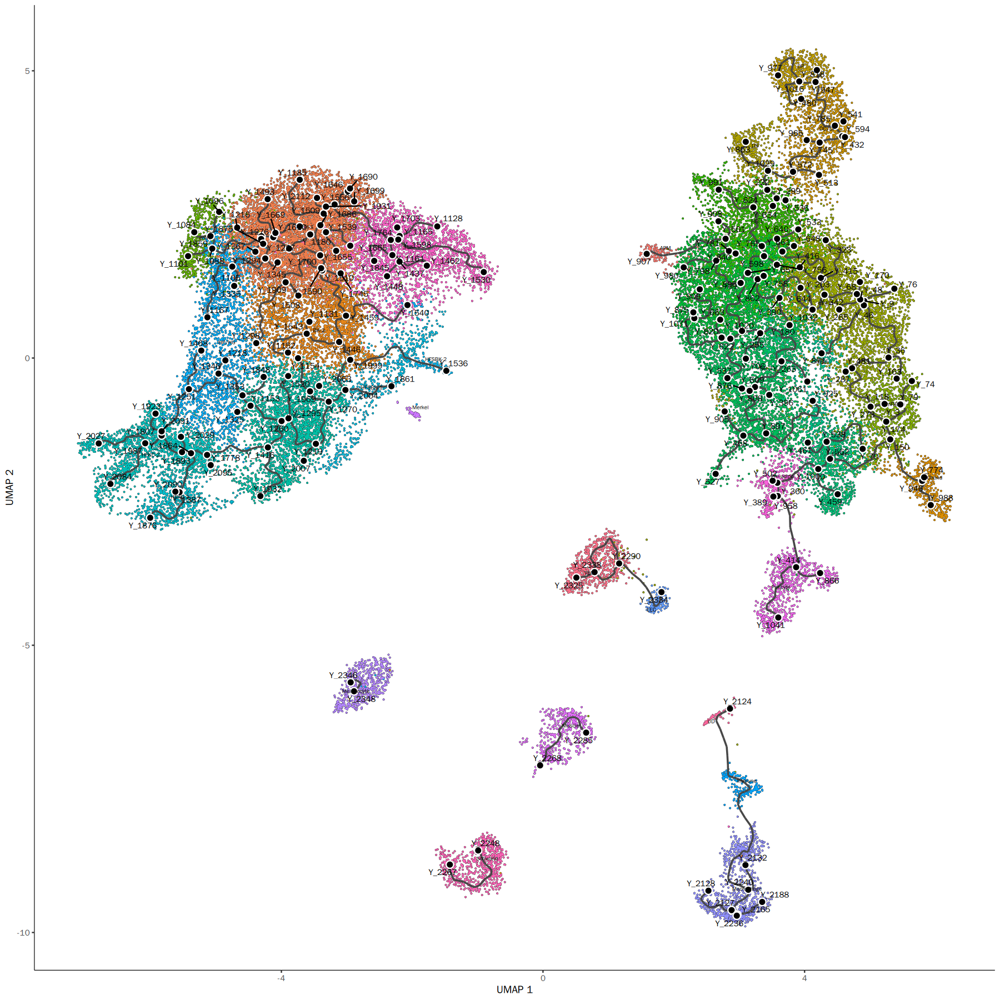

In [67]:
plot_cells(upper.cds,
           color_cells_by = "label",
           label_groups_by_cluster=FALSE,
           label_leaves=FALSE,
           label_branch_points=FALSE, label_principal_points = TRUE)

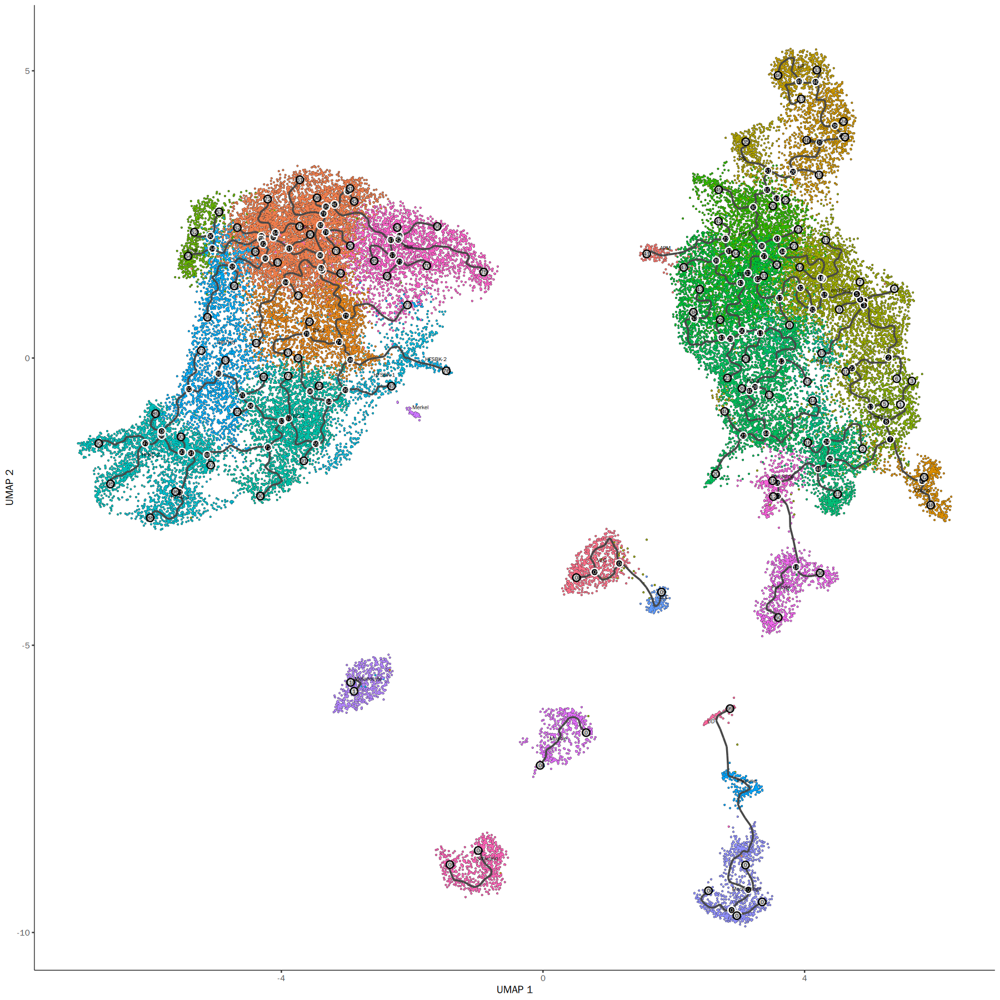

In [68]:
plot_cells(upper.cds,
           color_cells_by = "label",
           label_groups_by_cluster=FALSE,
           label_leaves=TRUE,
           label_branch_points=TRUE, label_principal_points = FALSE)

In [101]:
skin@meta.data['bulk']

,bulk
,<chr>
E13.5_ATAC_AAACGAAAGCCTCGCA-1,E13.5
E13.5_ATAC_AAACGAAGTAGACGCA-1,E13.5
E13.5_ATAC_AAACGAAGTCATAGAA-1,E13.5
E13.5_ATAC_AAACGAAGTTACTTTC-1,E13.5
E13.5_ATAC_AAACGAATCTATGAGC-1,E13.5
E13.5_ATAC_AAACGAATCTGGCGCA-1,E13.5
E13.5_ATAC_AAACGAATCTGTGTGA-1,E13.5
E13.5_ATAC_AAACTCGAGATCCGAG-1,E13.5
E13.5_ATAC_AAACTCGAGTTTACGC-1,E13.5


In [53]:
e13.5_barcodes <- rownames(skin@meta.data)[skin@meta.data$bulk == "E13.5"]
print(e13.5_barcodes)
writeLines(e13.5_barcodes, "e13.5.txt")

   [1] "E13.5_ATAC_AAACGAAAGCCTCGCA-1" "E13.5_ATAC_AAACGAAGTAGACGCA-1"
   [3] "E13.5_ATAC_AAACGAAGTCATAGAA-1" "E13.5_ATAC_AAACGAAGTTACTTTC-1"
   [5] "E13.5_ATAC_AAACGAATCTATGAGC-1" "E13.5_ATAC_AAACGAATCTGGCGCA-1"
   [7] "E13.5_ATAC_AAACGAATCTGTGTGA-1" "E13.5_ATAC_AAACTCGAGATCCGAG-1"
   [9] "E13.5_ATAC_AAACTCGAGTTTACGC-1" "E13.5_ATAC_AAACTCGCACAGTTAC-1"
  [11] "E13.5_ATAC_AAACTCGCACTTTGGA-1" "E13.5_ATAC_AAACTCGCAGCGTGAA-1"
  [13] "E13.5_ATAC_AAACTCGCAGTAACCT-1" "E13.5_ATAC_AAACTCGCAGTAACTC-1"
  [15] "E13.5_ATAC_AAACTCGGTGATGTGG-1" "E13.5_ATAC_AAACTCGTCGGCTATA-1"
  [17] "E13.5_ATAC_AAACTGCAGATGTTGA-1" "E13.5_ATAC_AAACTGCAGTCAGCCC-1"
  [19] "E13.5_ATAC_AAACTGCCAAGAAACT-1" "E13.5_ATAC_AAACTGCCATTTAGGC-1"
  [21] "E13.5_ATAC_AAACTGCGTCCGTGCA-1" "E13.5_ATAC_AAACTGCGTCGAGAAC-1"
  [23] "E13.5_ATAC_AAACTGCTCCATACGA-1" "E13.5_ATAC_AAACTGCTCCTATCAT-1"
  [25] "E13.5_ATAC_AAACTGCTCCTGACCT-1" "E13.5_ATAC_AAACTGCTCGATAGCT-1"
  [27] "E13.5_ATAC_AAACTGCTCGATGAAA-1" "E13.5_ATAC_AAACTGCTCGGTAGGA-1"
  [29]

In [69]:
upper.cds <- order_cells(upper.cds, reduction_method = "UMAP", root_cells = e13.5_barcodes) 

In [16]:
options(repr.plot.width = 15, repr.plot.height = 15)

Cells aren't colored in a way that allows them to be grouped.



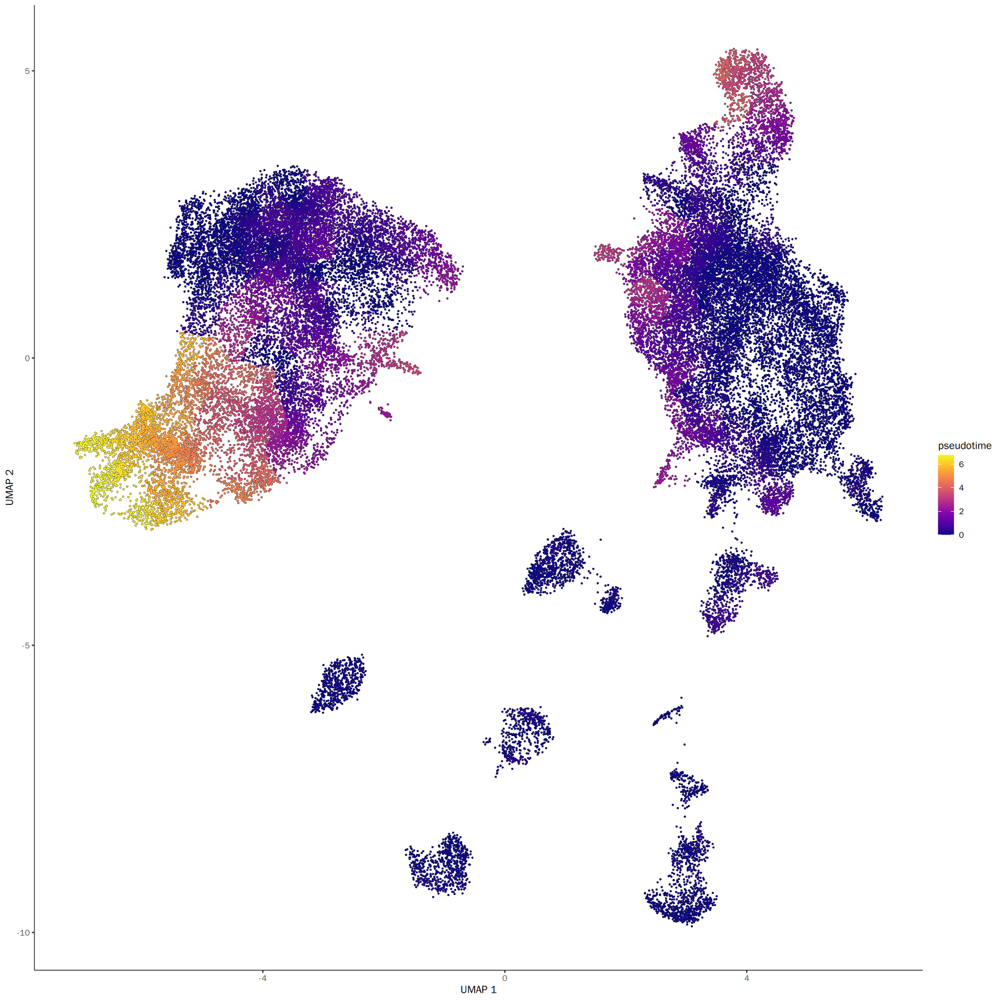

In [70]:
plot_cells(
  cds = upper.cds,
  color_cells_by = "pseudotime",
  show_trajectory_graph = FALSE, label_groups_by_cluster = TRUE,
)

Cells aren't colored in a way that allows them to be grouped.



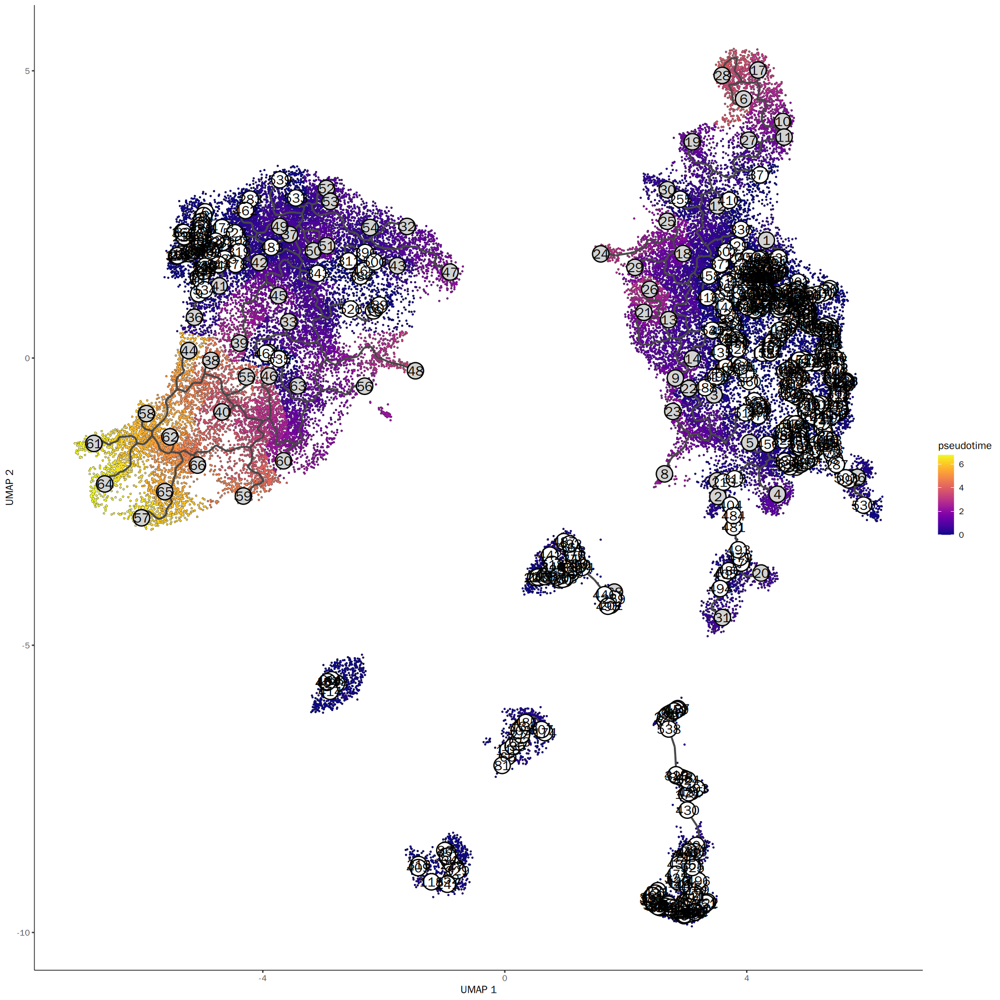

In [72]:
plot_cells(
  cds = upper.cds,
  color_cells_by = "pseudotime",
  group_cells_by = "label",
  show_trajectory_graph = TRUE, label_groups_by_cluster = TRUE, label_cell_groups = TRUE,
  group_label_size = 5,
  labels_per_group = 1,
  label_branch_points = FALSE,
  label_roots = TRUE,
  label_leaves = TRUE,
  graph_label_size = 5,
)

Cells aren't colored in a way that allows them to be grouped.



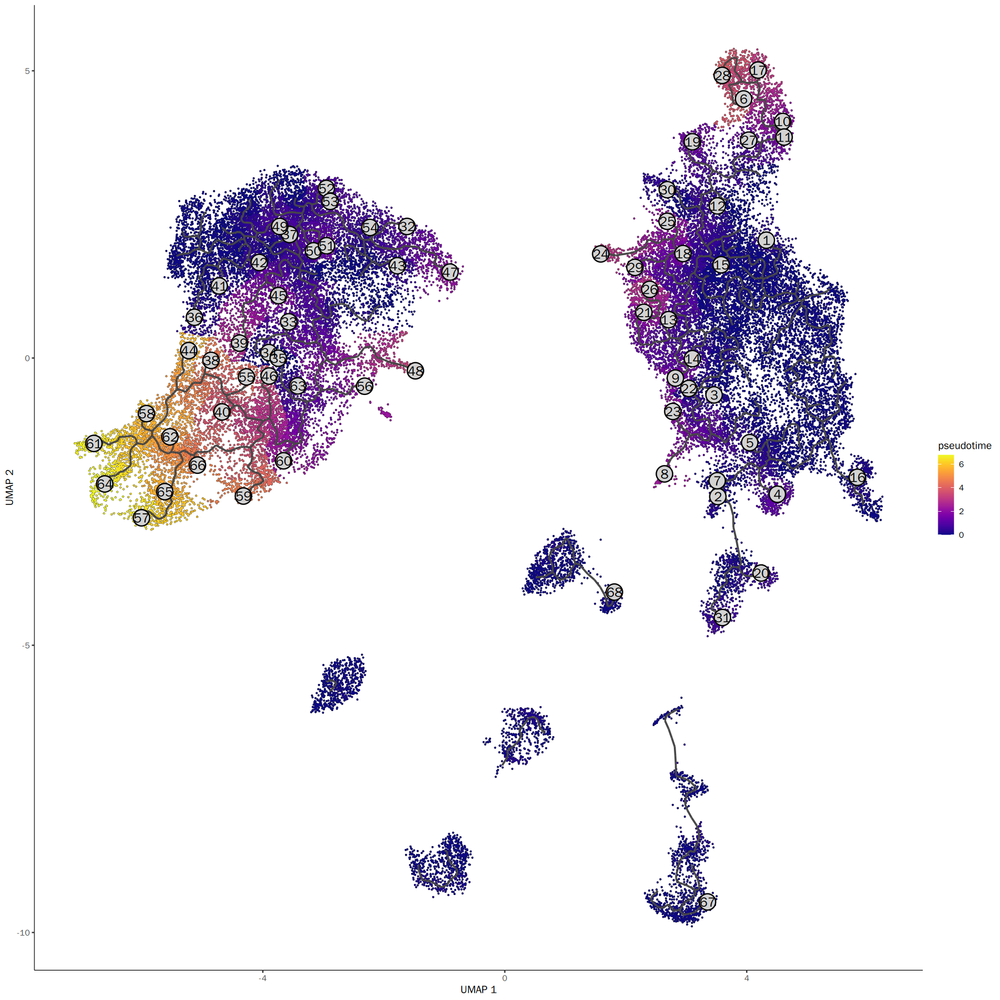

In [73]:
plot_cells(
  cds = upper.cds,
  color_cells_by = "pseudotime",
  group_cells_by = "label",
  show_trajectory_graph = TRUE, label_groups_by_cluster = TRUE, label_cell_groups = TRUE,
  group_label_size = 5,
  labels_per_group = 1,
  label_branch_points = FALSE,
  label_roots = FALSE,
  label_leaves = TRUE,
  graph_label_size = 5,
)

In [74]:
options(repr.plot.width = 15, repr.plot.height = 13)

Cells aren't colored in a way that allows them to be grouped.



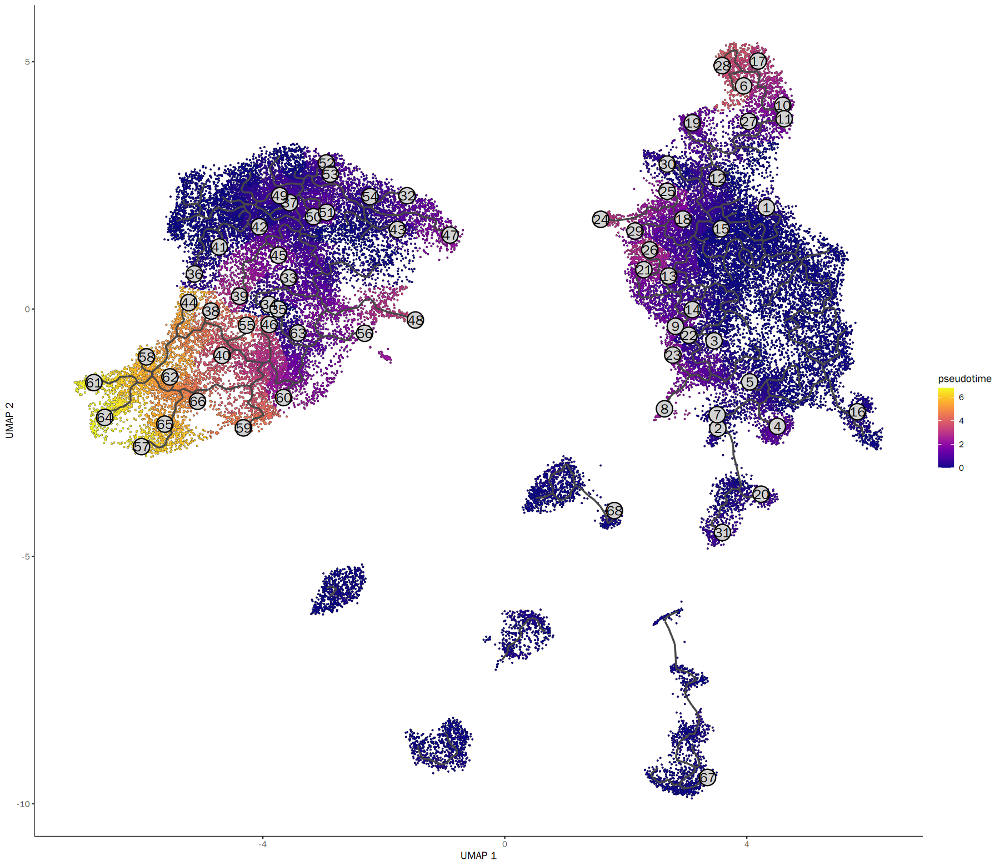

In [75]:
plot_cells(
  cds = upper.cds,
  color_cells_by = "pseudotime",
  show_trajectory_graph = TRUE, label_groups_by_cluster = TRUE, label_cell_groups = TRUE,
  group_label_size = 5,
  labels_per_group = 1,
  label_branch_points = FALSE,
  label_roots = FALSE,
  label_leaves = TRUE,
  graph_label_size = 5,
)

In [85]:
options(repr.plot.width = 15, repr.plot.height = 12)

Cells aren't colored in a way that allows them to be grouped.



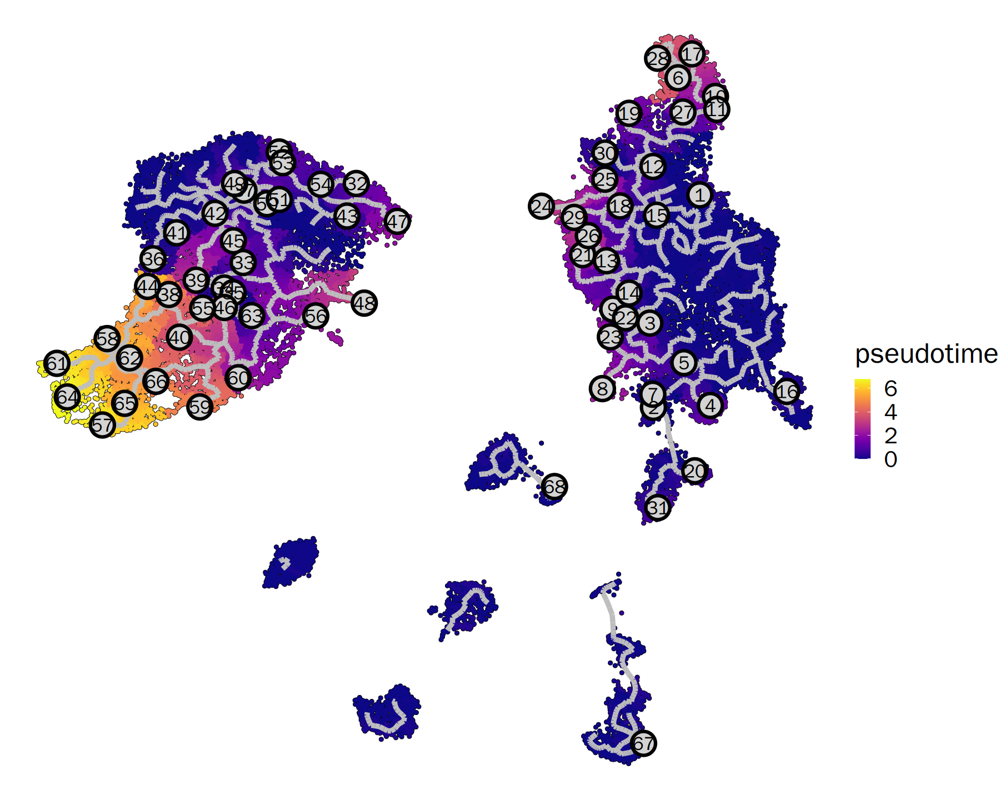

In [86]:
plot_cells(
  cds = upper.cds,
  color_cells_by = "pseudotime",
  show_trajectory_graph = TRUE, label_groups_by_cluster = TRUE, label_cell_groups = TRUE,
  group_label_size = 6,
  labels_per_group = 1,
  label_branch_points = FALSE,
  label_roots = FALSE,
  label_leaves = TRUE,
  graph_label_size = 7, cell_size = 1,   trajectory_graph_color = "grey", trajectory_graph_segment_size = 2,
) +theme_void(base_size = 30) +NoAxes()

In [87]:
ggsave("Trajectory3.png", dev='png', width =15, height =12)